<a href="https://colab.research.google.com/github/ctorney/learning-to-simulate-tf2/blob/main/test-files/BoundaryParticlesVelocitySpektralModel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install spektral

In [4]:
#@title ### Imports { form-width: "30%" }
#@markdown TODO: -Add boundary particles\
#@markdown -Add noise to training data

import os, sys
import numpy as np
from math import *
from tqdm import tqdm
import matplotlib.pyplot as plt
from matplotlib import animation, rc

import tensorflow as tf

from scipy import stats

import pickle

import functools
from tqdm import tqdm

from tensorflow.keras import Model
from tensorflow.keras.layers import Dense, Input, Concatenate
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K

from spektral.layers import ECCConv, GlobalAvgPool, MessagePassing, XENetConv, GlobalAttentionPool, GlobalMaxPool, GlobalSumPool,GlobalAttnSumPool


plt.style.use('ggplot')
plt.style.use('seaborn-paper') 
plt.style.use('seaborn-whitegrid')

# Generate Data

In [5]:
#@title ### Zonal Model { form-width: "30%" }

def get_record(group_id,pos,vel,acc):
    feature = { 'group_id': tf.train.Feature(int64_list=tf.train.Int64List(value=[group_id])),
                'pos': tf.train.Feature(bytes_list=tf.train.BytesList(value=[pos.numpy()])),
                'vel': tf.train.Feature(bytes_list=tf.train.BytesList(value=[vel.numpy()])),
                'acc': tf.train.Feature(bytes_list=tf.train.BytesList(value=[acc.numpy()]))
                }
    return tf.train.Example(features=tf.train.Features(feature=feature))


class zonal_model:
    def __init__(self, N, timesteps, discard, repeat, L, dt, save_interval,train_directory='train_datasets', valid_directory='valid_datasets', disable_progress=False):
        self.N = N
        self.timesteps = timesteps
        self.discard = discard
        self.B = repeat  # repeat for B batches
        self.L = L
        self.dt = dt
        self.save_interval = save_interval
        
        self.micro_state = np.zeros((self.B, (self.timesteps - self.discard)//self.save_interval, N, 4),dtype=np.float32)

        self.sim_counter=0

        if not os.path.exists(train_directory):
            os.makedirs(train_directory)

        if not os.path.exists(valid_directory):
            os.makedirs(valid_directory)

        self.train_directory = train_directory
        self.valid_directory = valid_directory

        # turn progress bar on or off
        self.disable_progress = disable_progress

        self.valid_fraction = 0.1
        
    def initialise_state(self):

        #self.positions = tf.random.uniform((self.B,self.N,2),0.5*self.L, 0.5*self.L+20) #0,self.L)
        self.positions = tf.random.uniform((self.B,self.N,2),0, self.L) 
        self.angles = tf.random.uniform((self.B,self.N,1), 0, 2*pi) #
        


    def run_sim(self, *params):

        eta, Ra, Ro, Rr, vs, va, sigma = params
        
        record_file = self.train_directory + '/microstates-' + str(self.sim_counter) + '.tfrecords'
        self.writer = tf.io.TFRecordWriter(record_file) 
        
        valid_file = self.valid_directory + '/microstates-' + str(self.sim_counter) + '.tfrecords'
        self.validwriter = tf.io.TFRecordWriter(valid_file) 
        
        # tensorflow function to run an update step
        @tf.function
        def update_tf(X, A):
            cos_A = tf.math.cos(A)
            sin_A = tf.math.sin(A)


            Xx = tf.expand_dims(X[...,0],-1)
            dx = -Xx + tf.linalg.matrix_transpose(Xx)
            dx = tf.where(dx>0.5*self.L, dx-self.L, dx)
            dx = tf.where(dx<-0.5*self.L, dx+self.L, dx)

            Xy = tf.expand_dims(X[...,1],-1)
            dy = -Xy + tf.linalg.matrix_transpose(Xy)
            dy = tf.where(dy>0.5*self.L, dy-self.L, dy)
            dy = tf.where(dy<-0.5*self.L, dy+self.L, dy)


            angle_to_neigh = tf.math.atan2(dy, dx)
            cos_N = tf.math.cos(angle_to_neigh)
            sin_N = tf.math.sin(angle_to_neigh)
            rel_angle_to_neigh = angle_to_neigh - A
            rel_angle_to_neigh = tf.math.atan2(tf.math.sin(rel_angle_to_neigh), tf.math.cos(rel_angle_to_neigh))
            
            dist = tf.math.sqrt(tf.square(dx)+tf.square(dy))
    
            # repulsion 
            rep_x = tf.where(dist<=Rr, -dx, tf.zeros_like(dx))
            rep_x = tf.where(rel_angle_to_neigh<0.5*va, rep_x, tf.zeros_like(rep_x))
            rep_x = tf.where(rel_angle_to_neigh>-0.5*va, rep_x, tf.zeros_like(rep_x))
            rep_x = tf.math.divide_no_nan(rep_x,tf.math.square(dist))
            rep_x = tf.reduce_sum(rep_x,axis=2)

            rep_y = tf.where(dist<=Rr, -dy, tf.zeros_like(dy))
            rep_y = tf.where(rel_angle_to_neigh<0.5*va, rep_y, tf.zeros_like(rep_y))
            rep_y = tf.where(rel_angle_to_neigh>-0.5*va, rep_y, tf.zeros_like(rep_y))
            rep_y = tf.math.divide_no_nan(rep_y,tf.math.square(dist))
            rep_y = tf.reduce_sum(rep_y,axis=2)

            # alignment 
            align_x = tf.where(dist<=Ro, cos_A, tf.zeros_like(cos_A))
            align_x = tf.where(rel_angle_to_neigh<0.5*va, align_x, tf.zeros_like(align_x))
            align_x = tf.where(rel_angle_to_neigh>-0.5*va, align_x, tf.zeros_like(align_x))
            align_x = tf.reduce_sum(align_x,axis=1)
            
            align_y = tf.where(dist<=Ro, sin_A, tf.zeros_like(sin_A))
            align_y = tf.where(rel_angle_to_neigh<0.5*va, align_y, tf.zeros_like(align_y))
            align_y = tf.where(rel_angle_to_neigh>-0.5*va, align_y, tf.zeros_like(align_y))
            align_y = tf.reduce_sum(align_y,axis=1)

            al_norm = tf.math.sqrt(align_x**2+align_y**2)
            align_x = tf.math.divide_no_nan(align_x,al_norm)
            align_y = tf.math.divide_no_nan(align_y,al_norm)

            # attractive interactions
            attr_x = tf.where(dist<=Ra, dx, tf.zeros_like(dx))
            attr_x = tf.where(rel_angle_to_neigh<0.5*va, attr_x, tf.zeros_like(attr_x))
            attr_x = tf.where(rel_angle_to_neigh>-0.5*va, attr_x, tf.zeros_like(attr_x))
            attr_x = tf.reduce_sum(attr_x,axis=2)

            attr_y = tf.where(dist<=Ra, dy, tf.zeros_like(dy))
            attr_y = tf.where(rel_angle_to_neigh<0.5*va, attr_y, tf.zeros_like(attr_y))
            attr_y = tf.where(rel_angle_to_neigh>-0.5*va, attr_y, tf.zeros_like(attr_y))
            attr_y = tf.reduce_sum(attr_y,axis=2)

            at_norm = tf.math.sqrt(attr_x**2+attr_y**2)
            attr_x = tf.math.divide_no_nan(attr_x,at_norm)
            attr_y = tf.math.divide_no_nan(attr_y,at_norm)

            # combine angles and convert to desired angle change
            social_x = rep_x + align_x + attr_x
            social_y = rep_y + align_y + attr_y

            d_angle = tf.math.atan2(social_y,social_x)
            d_angle = tf.expand_dims(d_angle,-1)

            
            d_angle = tf.math.atan2((1-eta)*tf.math.sin(d_angle) + eta*sin_A, (1-eta)*tf.math.cos(d_angle) + eta*cos_A)

            d_angle = d_angle - A
            d_angle = tf.where(d_angle>pi, d_angle-2*pi, d_angle)
            d_angle = tf.where(d_angle<-pi, d_angle+2*pi, d_angle)


            # add perception noise
            noise = tf.random.normal(shape=(self.B,self.N,1),mean=0,stddev=sigma*(self.dt**0.5))
            d_angle = d_angle + noise
            
            # restrict to maximum turning angle
            #d_angle = tf.where(tf.math.abs(d_angle)>eta*self.dt, tf.math.sign(d_angle)*eta*self.dt, d_angle)
            
            # rotate headings
            A = A + d_angle
            
            # update positions
            velocity = self.dt*vs*tf.concat([tf.cos(A),tf.sin(A)],axis=-1)
            X += velocity

            # add periodic boundary conditions
            A = tf.where(A<-pi,  A+2*pi, A)
            A = tf.where(A>pi, A-2*pi, A)

            X = tf.where(X>self.L, X-self.L, X)
            X = tf.where(X<0, X+self.L, X)

            X = tf.where(X>self.L, X-self.L, X)
            X = tf.where(X<0, X+self.L, X)

            return X, A
            
        self.initialise_state()

        counter=0
        for i in tqdm(range(self.timesteps),disable=self.disable_progress):
            self.positions, self.angles = update_tf(self.positions,  self.angles)
            if i>=self.discard:
                if i%self.save_interval==0:
                    # store in an array in case we want to visualise
                    self.micro_state[:,counter,:,0:2] = self.positions.numpy()
                    self.micro_state[:,counter,:,2:3] = np.cos(self.angles.numpy())
                    self.micro_state[:,counter,:,3:4] = np.sin(self.angles.numpy())
                    
                        
                    

                    counter = counter + 1

        for b in range(self.B):
            self.save_tf_record(b)

        self.writer.close()
        self.validwriter.close()
        self.sim_counter+=1
        return 

    def save_tf_record(self, b):
        pos =  tf.io.serialize_tensor(self.micro_state[b,:,:,0:2])
        vel =  tf.io.serialize_tensor(self.micro_state[b,:,:,2:4])
        acc =  tf.io.serialize_tensor(np.gradient(self.micro_state[b,:,:,2:4], axis=1))

        tf_record = get_record(b,pos,vel,acc)
        if b> self.B*self.valid_fraction:
            self.writer.write(tf_record.SerializeToString())
        else:
            self.validwriter.write(tf_record.SerializeToString())

        
        return 

In [38]:
#@title ### Params { form-width: "30%" }

n_points=50 #10

param_values = np.linspace(0,25,n_points)
L= 200
N= 100 
repeat = 100
discard = 0
timesteps = 500
save_interval=1
dt=1


sim = zonal_model(N,timesteps=timesteps+discard,discard=discard,L=L,repeat=repeat, dt=dt,save_interval=save_interval,disable_progress=False)

latt=0  # adapt
lrep= 0 # adapt
lali= 5 # adapt
eta=0.5 # adapt
va=2*pi # adapt
vs=1 # fix 
sigma=0.1 

In [39]:
#@title ### Create Training Data { form-width: "30%" }

def evaluate_zonal_model():
    sim.run_sim(eta, latt, lali, lrep, vs, va, sigma)
    return

evaluate_zonal_model()

"""
for i in tqdm(range(param_values.shape[0])):
    evaluate_zonal_model(param_values[i])
"""

100%|██████████| 500/500 [01:08<00:00,  7.35it/s]


'\nfor i in tqdm(range(param_values.shape[0])):\n    evaluate_zonal_model(param_values[i])\n'

# Parsing/Preprocessing

In [40]:
#@title ### Parsing Functions { form-width: "30%" }


def _parse_record(x):
  # Parse the input tf.train.Example proto using the dictionary above.
  return tf.io.parse_single_example(x, feature_description)

def _parse_tensor(x):
    output = {'group_id': x['group_id'],
                'pos': tf.io.parse_tensor(x['pos'],out_type=tf.float32),
                'vel': tf.io.parse_tensor(x['vel'],out_type=tf.float32),
                'acc': tf.io.parse_tensor(x['acc'],out_type=tf.float32)
                }
    return output

def make_window_dataset(x):
    # make a dataset from the time series tensor
    windows = tf.data.Dataset.from_tensor_slices((x['pos'],x['vel'],x['acc']))
    # convert to windows
    windows = windows.window(WINDOW_SIZE, shift=1, stride=1)
    # take a batch of window size and combine pos, vel, acc to a single dataset
    windows = windows.flat_map(lambda pos_ds,vel_ds,acc_ds: tf.data.Dataset.zip((pos_ds.batch(WINDOW_SIZE, drop_remainder=True),vel_ds.batch(WINDOW_SIZE, drop_remainder=True),acc_ds.batch(WINDOW_SIZE, drop_remainder=True))))
    return windows


def split_targets(x, y, z, w=7):
    inputs = (x[0:w-1], y[0:w-1], z[0:w-1])
    targets = y[-1]
    return (inputs, targets)


def _parse_graph(inputs, targets):
    #inputs, targets = x
    X, V, A = inputs
    X_current = X[-1]
    V_current = V[-1]

    Xx = tf.expand_dims(X_current[...,0],-1)
    dx = -Xx + tf.linalg.matrix_transpose(Xx)
    dx = tf.where(dx>0.5*DOMAIN_SIZE, dx-DOMAIN_SIZE, dx)
    dx = tf.where(dx<-0.5*DOMAIN_SIZE, dx+DOMAIN_SIZE, dx)

    Xy = tf.expand_dims(X_current[...,1],-1)
    dy = -Xy + tf.linalg.matrix_transpose(Xy)
    dy = tf.where(dy>0.5*DOMAIN_SIZE, dy-DOMAIN_SIZE, dy)
    dy = tf.where(dy<-0.5*DOMAIN_SIZE, dy+DOMAIN_SIZE, dy)

    Vx = tf.expand_dims(V_current[...,0],-1)
    dvx = -Vx + tf.linalg.matrix_transpose(Vx)

    Vy = tf.expand_dims(V_current[...,1],-1)
    dvy = -Vy + tf.linalg.matrix_transpose(Vy)
    
    dvnorm = tf.math.sqrt(dvx**2+dvy**2)
    dvx = tf.math.divide_no_nan(dvx,dvnorm)
    dvy = tf.math.divide_no_nan(dvy,dvnorm)

    angles = tf.expand_dims(tf.math.atan2(V_current[...,1],V_current[...,0]),-1)
    angle_to_neigh = tf.math.atan2(dy, dx)

    rel_angle_to_neigh = angle_to_neigh - angles

    dist = tf.math.sqrt(tf.square(dx)+tf.square(dy))

    interaction_radius = 25.0# tf.reduce_mean(dist,axis=[1,2],keepdims=True)
    adj_matrix = tf.where(dist<interaction_radius, tf.ones_like(dist,dtype=tf.int32), tf.zeros_like(dist,dtype=tf.int32))
    adj_matrix = tf.linalg.set_diag(adj_matrix, tf.zeros(tf.shape(adj_matrix)[:2],dtype=tf.int32))
    sender_recv_list = tf.where(adj_matrix)
    n_edge = tf.reduce_sum(adj_matrix, axis=[1,2])
    n_node = tf.ones_like(n_edge)*tf.shape(adj_matrix)[-1]

    output_i = tf.repeat(tf.range(tf.shape(adj_matrix)[0]),n_node)
    output_ie = tf.repeat(tf.range(tf.shape(adj_matrix)[0]),n_edge)


    senders = tf.squeeze(tf.slice(sender_recv_list,(0,1),size=(-1,1)))+ tf.squeeze(tf.slice(sender_recv_list,(0,0),size=(-1,1)))*tf.shape(adj_matrix,out_type=tf.int64)[-1]
    receivers = tf.squeeze(tf.slice(sender_recv_list,(0,2),size=(-1,1))) + tf.squeeze(tf.slice(sender_recv_list,(0,0),size=(-1,1)))*tf.shape(adj_matrix,out_type=tf.int64)[-1]

    output_a = tf.sparse.SparseTensor(indices=tf.stack([senders,receivers],axis=1), values = tf.ones_like(senders),dense_shape=[tf.shape(output_i)[0],tf.shape(output_i)[0]])
    edge_distance = tf.expand_dims(tf.gather_nd(dist/interaction_radius, sender_recv_list),-1)
    edge_x_distance =  tf.expand_dims(tf.gather_nd(tf.math.cos(rel_angle_to_neigh),sender_recv_list),-1)  # neigbour position relative to sender heading
    edge_y_distance =  tf.expand_dims(tf.gather_nd(tf.math.sin(rel_angle_to_neigh),sender_recv_list),-1)  # neigbour position relative to sender heading

    edge_x_orientation =  tf.expand_dims(tf.gather_nd(dvx,sender_recv_list),-1)  # neigbour velocity relative to sender heading
    edge_y_orientation =  tf.expand_dims(tf.gather_nd(dvy,sender_recv_list),-1)  # neigbour velocity relative to sender heading


    output_e = tf.concat([edge_distance,edge_x_distance,edge_y_distance,edge_x_orientation,edge_y_orientation],axis=-1)
    node_velocities = tf.transpose(V, perm=[1,0,2])
    node_accelerations = tf.transpose(A, perm=[1,0,2])

    # shape = node_velocities.get_shape().as_list()
    # dim = tf.math.reduce_prod(shape[1:])
    node_velocities = tf.reshape(node_velocities,(-1,2*(WINDOW_SIZE-1)))
    node_accelerations = tf.reshape(node_accelerations,(-1,2*(WINDOW_SIZE-1)))

    output_x = tf.concat([X_current, node_velocities, node_accelerations],axis=-1)
    #dist = tf.linalg.set_diag(dist, 25.0*tf.ones(tf.shape(dist)[:2],dtype=tf.float32))

    #dist_out =  tf.reduce_mean(tf.reduce_min(dist,axis=[2]),axis=[1])
    X_T, V_T, A_T = targets
    #node_targets = tf.concat([X_T, V_T, A_T], axis=-1)
    target = V_T

    return (output_x, output_a, output_e, output_i,output_ie), target#, tf.ones_like(targets)/max_params

In [41]:
#@title ### Preprocessing { form-width: "30%" }

train_dir = 'train_datasets/'
valid_dir = 'valid_datasets/'

WINDOW_SIZE=7

n_out = 2
n_feat_node = (WINDOW_SIZE-1)*4+2
n_feat_edge = 5

BATCH_SIZE=128
DOMAIN_SIZE=L


all_file_list = [train_dir + filename for filename in os.listdir(train_dir)]

#dataset_size = sum(1 for _ in tf.data.TFRecordDataset(all_file_list[0]))*len(all_file_list)//BATCH_SIZE


feature_description = {'group_id': tf.io.FixedLenFeature([], tf.int64),
                        'pos': tf.io.FixedLenFeature([], tf.string),
                        'vel': tf.io.FixedLenFeature([], tf.string),
                        'acc': tf.io.FixedLenFeature([], tf.string)}


split_with_window = functools.partial(
  split_targets,
  w=WINDOW_SIZE)



train_dataset =  tf.data.TFRecordDataset(tf.data.Dataset.list_files([train_dir + filename for filename in os.listdir(train_dir)]))

parsed_train_dataset = train_dataset.map(_parse_record)
parsed_train_dataset = parsed_train_dataset.map(_parse_tensor)
parsed_train_dataset = parsed_train_dataset.flat_map(make_window_dataset)
parsed_train_dataset = parsed_train_dataset.map(split_with_window)
parsed_train_dataset = parsed_train_dataset.shuffle(10000, reshuffle_each_iteration=True)
#parsed_train_dataset = parsed_train_dataset.repeat(EPOCHS)
parsed_train_dataset = parsed_train_dataset.batch(BATCH_SIZE, drop_remainder=True)
#parsed_train_dataset = parsed_train_dataset.map(_parse_graph)


valid_dataset =  tf.data.TFRecordDataset(tf.data.Dataset.list_files([valid_dir + filename for filename in os.listdir(valid_dir)]))

parsed_valid_dataset = valid_dataset.map(_parse_record)
parsed_valid_dataset = parsed_valid_dataset.map(_parse_tensor)
parsed_valid_dataset = parsed_valid_dataset.flat_map(make_window_dataset)
parsed_valid_dataset = parsed_valid_dataset.map(split_with_window)
parsed_valid_dataset = parsed_valid_dataset.shuffle(10000, reshuffle_each_iteration=True)
#parsed_valid_dataset = parsed_valid_dataset.repeat(EPOCHS)
parsed_valid_dataset = parsed_valid_dataset.batch(BATCH_SIZE, drop_remainder=True)
#parsed_valid_dataset = parsed_valid_dataset.map(_parse_graph)

# Model

In [44]:
#@title ### Preprocessing Layer { form-width: "30%" }
#@markdown -Issues with @tf.function here - input signature wrong (also possibly related to issue in train step)\
#@markdown -Adding uniform noise to every training step, like done in learning to simulate code but not how they describe in the paper

class PreprocessingLayer(tf.keras.layers.Layer):
    def __init__(self, L):
        super(PreprocessingLayer, self).__init__()
        self._L = L
        

    #@tf.function(input_signature=([tf.TensorSpec(shape=(None,WINDOW_SIZE-1,N,2), dtype=tf.float32),tf.TensorSpec(shape=(None,WINDOW_SIZE-1,N,2), dtype=tf.float32),tf.TensorSpec(shape=(None,WINDOW_SIZE-1,N,2), dtype=tf.float32)]))
    def call(self, inputs, train_mode=True):
        
        X, V, A = inputs
        # node features xpos, ypos, xvel, yvel
        # edge features distance, rel angle to receiver
        X_current = X[:,-1]
        V_current = V[:,-1]

        Xx = tf.expand_dims(X_current[...,0],-1)
        dx = -Xx + tf.linalg.matrix_transpose(Xx)
        dx = tf.where(dx>0.5*self._L, dx-self._L, dx)
        dx = tf.where(dx<-0.5*self._L, dx+self._L, dx)
        x_boundary_dist = tf.concat([Xx, self._L-Xx], axis=-1)

        Xy = tf.expand_dims(X_current[...,1],-1)
        dy = -Xy + tf.linalg.matrix_transpose(Xy)
        dy = tf.where(dy>0.5*self._L, dy-self._L, dy)
        dy = tf.where(dy<-0.5*self._L, dy+self._L, dy)
        y_boundary_dist = tf.concat([Xy, self._L-Xy], axis=-1)

        boundary_dist = tf.concat([x_boundary_dist, y_boundary_dist], axis=-1)

        Vx = tf.expand_dims(V_current[...,0],-1)
        dvx = -Vx + tf.linalg.matrix_transpose(Vx)

        Vy = tf.expand_dims(V_current[...,1],-1)
        dvy = -Vy + tf.linalg.matrix_transpose(Vy)
        
        dvnorm = tf.math.sqrt(dvx**2+dvy**2)
        dvx = tf.math.divide_no_nan(dvx,dvnorm)
        dvy = tf.math.divide_no_nan(dvy,dvnorm)

        angles = tf.expand_dims(tf.math.atan2(V_current[...,1],V_current[...,0]),-1)
        angle_to_neigh = tf.math.atan2(dy, dx)

        rel_angle_to_neigh = angle_to_neigh - angles

        dist = tf.math.sqrt(tf.square(dx)+tf.square(dy))

        interaction_radius = 25.0# tf.reduce_mean(dist,axis=[1,2],keepdims=True)
        adj_matrix = tf.where(dist<interaction_radius, tf.ones_like(dist,dtype=tf.int32), tf.zeros_like(dist,dtype=tf.int32))
        adj_matrix = tf.linalg.set_diag(adj_matrix, tf.zeros(tf.shape(adj_matrix)[:2],dtype=tf.int32))
        sender_recv_list = tf.where(adj_matrix)
        n_edge = tf.reduce_sum(adj_matrix, axis=[1,2])
        n_node = tf.ones_like(n_edge)*tf.shape(adj_matrix)[-1]
        output_i = tf.repeat(tf.range(tf.shape(adj_matrix)[0]),n_node)

        senders = tf.squeeze(tf.slice(sender_recv_list,(0,1),size=(-1,1)))+ tf.squeeze(tf.slice(sender_recv_list,(0,0),size=(-1,1)))*tf.shape(adj_matrix,out_type=tf.int64)[-1]
        receivers = tf.squeeze(tf.slice(sender_recv_list,(0,2),size=(-1,1))) + tf.squeeze(tf.slice(sender_recv_list,(0,0),size=(-1,1)))*tf.shape(adj_matrix,out_type=tf.int64)[-1]

        output_a = tf.sparse.SparseTensor(indices=tf.stack([senders,receivers],axis=1), values = tf.ones_like(senders),dense_shape=[tf.shape(output_i)[0],tf.shape(output_i)[0]])
        edge_distance = tf.expand_dims(tf.gather_nd(dist/self._L,sender_recv_list),-1)
        #print("ed", edge_distance.shape)
        edge_x_distance = tf.expand_dims(tf.gather_nd(tf.math.cos(rel_angle_to_neigh),sender_recv_list),-1)  # neigbour position relative to sender heading
        edge_y_distance = tf.expand_dims(tf.gather_nd(tf.math.sin(rel_angle_to_neigh),sender_recv_list),-1)  # neigbour position relative to sender heading
        edge_x_orientation = tf.expand_dims(tf.gather_nd(dvx,sender_recv_list),-1)  # neigbour velocity relative to sender heading
        edge_y_orientation = tf.expand_dims(tf.gather_nd(dvy,sender_recv_list),-1)  # neigbour velocity relative to sender heading


        output_e = tf.concat([edge_distance,edge_x_distance,edge_y_distance,edge_x_orientation,edge_y_orientation],axis=-1)
        #edges = tf.concat([edge_distance,edge_x_distance,edge_y_distance],axis=-1)
        node_velocities = tf.transpose(V, perm=[0,2,1,3])
        node_accelerations = tf.transpose(A, perm=[0,2,1,3])
        
        # shape = node_velocities.get_shape().as_list()
        # dim = tf.math.reduce_prod(shape[1:])
        node_velocities = tf.reshape(node_velocities,(-1,2*(WINDOW_SIZE-1)))
        node_accelerations = tf.reshape(node_accelerations,(-1,2*(WINDOW_SIZE-1)))
        node_positions = (X_current - (self._L/2.))/self._L
        node_positions = tf.reshape(node_positions,(-1,2))
        boundary_dist = tf.reshape(boundary_dist, (-1,4))
        output_x = tf.concat([node_positions, node_velocities, node_accelerations, boundary_dist],axis=-1)
        if train_mode=True:
            noise_std = 6.7e-4
            num_velocities = WINDOW_SIZE-1
            output_x+=tf.random.normal(tf.shape(output_x),
                                      stddev=noise_std / num_velocities ** 0.5,
                                      dtype=output_x.dtype)
        #dist = tf.linalg.set_diag(dist, 25.0*tf.ones(tf.shape(dist)[:2],dtype=tf.float32))

        #dist_out =  tf.reduce_mean(tf.reduce_min(dist,axis=[2]),axis=[1])
        #X_T, V_T, A_T = targets
        #node_targets = tf.concat([X_T, V_T, A_T], axis=-1)
        #target = A_T
        #output_x.set_shape((None,n_feat_node))
        #output_a.set_shape((None,N))
        #output_e.set_shape((None,5))
        #input_graphs = utils_tf.set_zero_global_features(input_graphs,self._output_size)
        return output_x, output_a, output_e, output_i

In [ ]:
#@title ### Pre-Model { form-width: "30%" }

pos = Input(shape=(WINDOW_SIZE-1,N,2))
vel = Input(shape=(WINDOW_SIZE-1,N,2))
acc = Input(shape=(WINDOW_SIZE-1,N,2))

output = PreprocessingLayer(200)([pos,vel,acc])

pre_model = Model(inputs=[pos,vel,acc], outputs=output)

for data_batch in parsed_train_dataset.take(1):
    pre_model(data_batch[0])
    break

In [45]:
#@title ### Build model { form-width: "30%" }

#learning_rate = 1e-5
min_lr = 1e-6
lr = tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=1e-4 - min_lr,
                                decay_steps=int(5e6),
                                decay_rate=0.1) #+ min_lr


class GNNNet(Model):
    def __init__(self,n_out=4,mp_steps=2):
        super().__init__()
        self.preprocess = PreprocessingLayer(DOMAIN_SIZE)
        self.encoder = ECCConv(32, activation="tanh")
        self.process = MessagePassing(aggregate='mean')# 32, activation="relu")
        self.decoder = ECCConv(n_out, activation="tanh")
        #self.global_pool = GlobalAvgPool()
        #self.dense = Dense(32, activation="relu")
        #self.final = Dense(n_out, activation="sigmoid")
        self.mp_steps=mp_steps
    
    def call(self, inputs, train_mode=True):
        x, a, e, i = self.preprocess(inputs, train_mode=train_mode)
        #x.set_shape([None,None])
        #print(x.shape, a.shape, e.shape, i.shape)
        x = self.encoder([x, a, e])
        for _ in range(self.mp_steps):
            x = self.process([x, a, e])         
        x = self.decoder([x, a, e])

        #x = self.global_pool([x, i])
        #x = self.dense(x)
        #x = self.final(x)

        x = tf.reshape(x, (-1, N, 2))

        return x

def op_loss(y_true, y_pred):
    weight = 0.5
    p_mean, t_mean = tf.reduce_mean(y_pred, axis=1), tf.reduce_mean(y_true, axis=1)
    pred_op, target_op = tf.norm(p_mean, axis=1), tf.norm(t_mean, axis=1)
    nodes_loss = K.mean(K.square(y_true-y_pred))
    op_loss = K.mean(K.square(target_op-pred_op))
    #print((1-weight)*nodes_loss+weight*op_loss)
    return (1-weight)*nodes_loss+weight*op_loss

model = GNNNet(n_out=n_out)
optimizer = Adam(lr)
loss_fn = MeanSquaredError()
#model.build(input_shape=((None,WINDOW_SIZE-1,N,2)))
#model.summary()

In [46]:
#@title ### Fit model { form-width: "30%" }
#@markdown Issues with @tf.function here - 1st dimension of sender_recv_list in preprocessing layer does not compute a dimension and causes error in encoder step. Hacky fix - do not use @tf.function

#@tf.function()#input_signature=[[tf.TensorSpec(shape=(None,None,2), dtype=tf.float32),tf.TensorSpec(shape=(None,None,2), dtype=tf.float32),tf.TensorSpec(shape=(None,None,2), dtype=tf.float32)],tf.TensorSpec(shape=(None,4), dtype=tf.float32)], experimental_relax_shapes=True)
def train_step(inputs, target):
    with tf.GradientTape() as tape:
        predictions = model(inputs, training=True)
        loss = loss_fn(target, predictions) #+ sum(model.losses)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    
    return loss

def train_step_op(inputs, target):
    with tf.GradientTape() as tape:
        predictions = model(inputs, training=True)
        loss = op_loss(target, predictions) #+ sum(model.losses)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    
    return loss

In [47]:
#@title ### Train Model { form-width: "30%" }
step = losses = 0
total=len(list(parsed_train_dataset))
epochs = 15  # Number of training epochs
batch_size = BATCH_SIZE  # Batch size
print(f"total = {total}, batch size = {batch_size}")
divisor=20
loss_values = np.zeros((epochs,total))

log_dir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
summary_writer = tf.summary.create_file_writer(logdir=log_dir)

for epoch in range(epochs):
    print("\nStart of epoch %d" % (epoch,))
    epoch_loss_avg = tf.keras.metrics.Mean()
    epoch_accuracy = tf.keras.metrics.SparseCategoricalAccuracy()
    for step, batch in tqdm(enumerate(parsed_train_dataset), total=total):
        inputs, target = batch
        #inputs = layer(inputs)
        losses = train_step(inputs,target)
        loss_values[epoch,step]=losses.numpy()
        epoch_loss_avg(loss_value)
        epoch_accuracy(y, model(x))
        if step%divisor==0:
            print(tf.reduce_mean(loss_values[epoch,max(0,step-divisor):step+1]).numpy())
    
    with summary_writer.as_default():
        tf.summary.scalar('epoch_loss_avg', epoch_loss_avg.result(), step=optimizer.iterations)
        tf.summary.scalar('epoch_accuracy', epoch_accuracy.result(), step=optimizer.iterations)

total = 343, batch size = 128

Start of epoch 0


  0%|          | 0/343 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/spektral/layers/convolutional/conv.py:94: UserWarning: The adjacency matrix of dtype <dtype: 'int64'> is incompatible with the dtype of the node features <dtype: 'float32'> and has been automatically cast to <dtype: 'float32'>.
  f"The adjacency matrix of dtype {a.dtype} is incompatible with the dtype "
  0%|          | 1/343 [00:04<22:49,  4.00s/it]

1.2086127996444702


  6%|▌         | 21/343 [00:32<07:30,  1.40s/it]

1.1065110365549724


 12%|█▏        | 41/343 [01:01<07:19,  1.46s/it]

0.9581691934948876


 18%|█▊        | 61/343 [01:30<06:51,  1.46s/it]

0.8862470104580834


 24%|██▎       | 81/343 [01:59<06:12,  1.42s/it]

0.8368198332332429


 29%|██▉       | 101/343 [02:27<05:33,  1.38s/it]

0.8121975291342962


 35%|███▌      | 121/343 [02:54<05:06,  1.38s/it]

0.8054004680542719


 41%|████      | 141/343 [03:22<04:44,  1.41s/it]

0.7895523480006627


 47%|████▋     | 161/343 [03:50<04:13,  1.39s/it]

0.7852718801725478


 53%|█████▎    | 181/343 [04:18<03:39,  1.36s/it]

0.7739865354129246


 59%|█████▊    | 201/343 [04:45<03:15,  1.38s/it]

0.7607877651850382


 64%|██████▍   | 221/343 [05:12<02:43,  1.34s/it]

0.7543333314713978


 70%|███████   | 241/343 [05:39<02:17,  1.35s/it]

0.7403962754067921


 76%|███████▌  | 261/343 [06:06<01:49,  1.34s/it]

0.7340906347547259


 82%|████████▏ | 281/343 [06:33<01:24,  1.36s/it]

0.7240166437058222


 88%|████████▊ | 301/343 [06:59<00:55,  1.31s/it]

0.709893578574771


 94%|█████████▎| 321/343 [07:26<00:28,  1.30s/it]

0.7026900053024292


 99%|█████████▉| 341/343 [07:52<00:02,  1.35s/it]

0.6879439126877558


100%|██████████| 343/343 [07:55<00:00,  1.39s/it]



Start of epoch 1


  0%|          | 1/343 [00:03<19:09,  3.36s/it]

0.6961032152175903


  6%|▌         | 21/343 [00:31<07:42,  1.44s/it]

0.6707189622379485


 12%|█▏        | 41/343 [01:01<07:27,  1.48s/it]

0.6562130394436064


 18%|█▊        | 61/343 [01:30<06:46,  1.44s/it]

0.6516701635860261


 24%|██▎       | 81/343 [01:58<06:07,  1.40s/it]

0.6351704114959353


 29%|██▉       | 101/343 [02:26<05:33,  1.38s/it]

0.6196471481096177


 35%|███▌      | 121/343 [02:54<05:07,  1.38s/it]

0.609589778241657


 41%|████      | 141/343 [03:21<04:41,  1.39s/it]

0.5988206920169649


 47%|████▋     | 161/343 [03:49<04:13,  1.39s/it]

0.5906218943141756


 53%|█████▎    | 181/343 [04:17<03:43,  1.38s/it]

0.5758385800179981


 59%|█████▊    | 201/343 [04:44<03:14,  1.37s/it]

0.5628496919359479


 64%|██████▍   | 221/343 [05:11<02:42,  1.33s/it]

0.5451924942788624


 70%|███████   | 241/343 [05:38<02:18,  1.36s/it]

0.5298668515114557


 76%|███████▌  | 261/343 [06:05<01:48,  1.32s/it]

0.5156216252417791


 82%|████████▏ | 281/343 [06:31<01:21,  1.31s/it]

0.4998727327301389


 88%|████████▊ | 301/343 [06:57<00:55,  1.32s/it]

0.4881849303132012


 94%|█████████▎| 321/343 [07:24<00:32,  1.46s/it]

0.4767993830499195


 99%|█████████▉| 341/343 [07:51<00:02,  1.33s/it]

0.46413203080495197


100%|██████████| 343/343 [07:53<00:00,  1.38s/it]



Start of epoch 2


  0%|          | 1/343 [00:03<19:12,  3.37s/it]

0.4301431179046631


  6%|▌         | 21/343 [00:31<07:41,  1.43s/it]

0.4406006123338427


 12%|█▏        | 41/343 [01:00<07:15,  1.44s/it]

0.43789184661138625


 18%|█▊        | 61/343 [01:29<06:30,  1.38s/it]

0.436421662569046


 24%|██▎       | 81/343 [01:57<06:11,  1.42s/it]

0.4299810713245755


 29%|██▉       | 101/343 [02:25<05:37,  1.40s/it]

0.4212379299459003


 35%|███▌      | 121/343 [02:53<05:08,  1.39s/it]

0.41853512752623784


 41%|████      | 141/343 [03:20<04:36,  1.37s/it]

0.4066923601286752


 47%|████▋     | 161/343 [03:48<04:07,  1.36s/it]

0.3983883559703827


 53%|█████▎    | 181/343 [04:16<03:36,  1.34s/it]

0.38975150386492413


 59%|█████▊    | 201/343 [04:43<03:14,  1.37s/it]

0.37991010149319965


 64%|██████▍   | 221/343 [05:10<02:43,  1.34s/it]

0.37266234840665546


 70%|███████   | 241/343 [05:38<02:18,  1.35s/it]

0.36491812268892926


 76%|███████▌  | 261/343 [06:05<01:51,  1.36s/it]

0.35712686748731703


 82%|████████▏ | 281/343 [06:32<01:21,  1.31s/it]

0.3507334944747743


 88%|████████▊ | 301/343 [06:58<00:55,  1.31s/it]

0.34235153453690664


 94%|█████████▎| 321/343 [07:24<00:29,  1.32s/it]

0.3364657986731756


 99%|█████████▉| 341/343 [07:51<00:02,  1.32s/it]

0.3330991466840108


100%|██████████| 343/343 [07:53<00:00,  1.38s/it]



Start of epoch 3


  0%|          | 1/343 [00:03<19:34,  3.43s/it]

0.31594741344451904


  6%|▌         | 21/343 [00:31<07:44,  1.44s/it]

0.31906144108091083


 12%|█▏        | 41/343 [01:01<07:24,  1.47s/it]

0.31652834443818956


 18%|█▊        | 61/343 [01:30<06:45,  1.44s/it]

0.3136055724961417


 24%|██▎       | 81/343 [01:59<06:13,  1.43s/it]

0.3116278378736405


 29%|██▉       | 101/343 [02:27<05:37,  1.39s/it]

0.3040710077399299


 35%|███▌      | 121/343 [02:55<05:11,  1.40s/it]

0.3023798990817297


 41%|████      | 141/343 [03:22<04:41,  1.39s/it]

0.29721643811180476


 47%|████▋     | 161/343 [03:50<04:16,  1.41s/it]

0.29351160923639935


 53%|█████▎    | 181/343 [04:18<03:41,  1.37s/it]

0.28803512028285433


 59%|█████▊    | 201/343 [04:45<03:17,  1.39s/it]

0.28612672147296725


 64%|██████▍   | 221/343 [05:13<02:46,  1.37s/it]

0.28116024533907574


 70%|███████   | 241/343 [05:40<02:23,  1.41s/it]

0.2789790133635203


 76%|███████▌  | 261/343 [06:08<01:50,  1.35s/it]

0.2750629016331264


 82%|████████▏ | 281/343 [06:34<01:23,  1.34s/it]

0.2712431706133343


 88%|████████▊ | 301/343 [07:00<00:55,  1.32s/it]

0.26725517993881587


 94%|█████████▎| 321/343 [07:27<00:28,  1.29s/it]

0.2654320129326412


 99%|█████████▉| 341/343 [07:53<00:02,  1.35s/it]

0.26328734982581364


100%|██████████| 343/343 [07:56<00:00,  1.39s/it]



Start of epoch 4


  0%|          | 1/343 [00:03<19:54,  3.49s/it]

0.26077449321746826


  6%|▌         | 21/343 [00:32<07:40,  1.43s/it]

0.25506260423433214


 12%|█▏        | 41/343 [01:01<07:24,  1.47s/it]

0.255411962668101


 18%|█▊        | 61/343 [01:30<06:46,  1.44s/it]

0.2544219877038683


 24%|██▎       | 81/343 [01:59<06:09,  1.41s/it]

0.25001214089847745


 29%|██▉       | 101/343 [02:27<05:34,  1.38s/it]

0.2475706920737312


 35%|███▌      | 121/343 [02:54<05:07,  1.38s/it]

0.24449631997517177


 41%|████      | 141/343 [03:22<04:41,  1.40s/it]

0.24438198975154332


 47%|████▋     | 161/343 [03:51<04:14,  1.40s/it]

0.2439474051906949


 53%|█████▎    | 181/343 [04:18<03:37,  1.34s/it]

0.2388168949456442


 59%|█████▊    | 201/343 [04:46<03:16,  1.38s/it]

0.23869281297638303


 64%|██████▍   | 221/343 [05:13<02:47,  1.37s/it]

0.23681109717914037


 70%|███████   | 241/343 [05:41<02:20,  1.37s/it]

0.23595495663938068


 76%|███████▌  | 261/343 [06:08<01:50,  1.35s/it]

0.23168477274122692


 82%|████████▏ | 281/343 [06:34<01:20,  1.30s/it]

0.2315498207296644


 88%|████████▊ | 301/343 [07:01<00:55,  1.32s/it]

0.22970278773988997


 94%|█████████▎| 321/343 [07:28<00:28,  1.32s/it]

0.22784642236573355


 99%|█████████▉| 341/343 [07:54<00:02,  1.33s/it]

0.2271158652646201


100%|██████████| 343/343 [07:57<00:00,  1.39s/it]



Start of epoch 5


  0%|          | 1/343 [00:03<19:57,  3.50s/it]

0.220998615026474


  6%|▌         | 21/343 [00:31<07:39,  1.43s/it]

0.22253669940289997


 12%|█▏        | 41/343 [01:01<07:27,  1.48s/it]

0.22304552012965792


 18%|█▊        | 61/343 [01:30<06:44,  1.43s/it]

0.22157934591883705


 24%|██▎       | 81/343 [01:58<06:10,  1.42s/it]

0.21892782549063364


 29%|██▉       | 101/343 [02:26<05:41,  1.41s/it]

0.21713338721366154


 35%|███▌      | 121/343 [02:54<05:02,  1.36s/it]

0.21525264424937113


 41%|████      | 141/343 [03:22<04:41,  1.39s/it]

0.213239828035945


 47%|████▋     | 161/343 [03:50<04:12,  1.39s/it]

0.2148751857734862


 53%|█████▎    | 181/343 [04:17<03:43,  1.38s/it]

0.21307227086453212


 59%|█████▊    | 201/343 [04:45<03:16,  1.38s/it]

0.2112141258659817


 64%|██████▍   | 221/343 [05:12<02:43,  1.34s/it]

0.20906190503211247


 70%|███████   | 241/343 [05:39<02:19,  1.36s/it]

0.20922432910828365


 76%|███████▌  | 261/343 [06:06<01:51,  1.36s/it]

0.20718341711021604


 82%|████████▏ | 281/343 [06:33<01:20,  1.29s/it]

0.20638913625762575


 88%|████████▊ | 301/343 [06:59<00:56,  1.35s/it]

0.2055299189828691


 94%|█████████▎| 321/343 [07:26<00:29,  1.33s/it]

0.20369736566430047


 99%|█████████▉| 341/343 [07:52<00:02,  1.35s/it]

0.2030974179506302


100%|██████████| 343/343 [07:55<00:00,  1.39s/it]



Start of epoch 6


  0%|          | 1/343 [00:03<19:09,  3.36s/it]

0.20078270137310028


  6%|▌         | 21/343 [00:31<07:38,  1.42s/it]

0.20112664926619755


 12%|█▏        | 41/343 [01:00<07:10,  1.43s/it]

0.20067739557652248


 18%|█▊        | 61/343 [01:29<06:47,  1.44s/it]

0.19908862525508517


 24%|██▎       | 81/343 [01:58<05:59,  1.37s/it]

0.19746548576014383


 29%|██▉       | 101/343 [02:26<05:29,  1.36s/it]

0.19535739861783527


 35%|███▌      | 121/343 [02:54<05:11,  1.40s/it]

0.1944651688848223


 41%|████      | 141/343 [03:22<04:46,  1.42s/it]

0.19320951898892721


 47%|████▋     | 161/343 [03:50<04:08,  1.37s/it]

0.19272224037420183


 53%|█████▎    | 181/343 [04:17<03:43,  1.38s/it]

0.19114350917793455


 59%|█████▊    | 201/343 [04:45<03:19,  1.41s/it]

0.19069040956951322


 64%|██████▍   | 221/343 [05:13<02:44,  1.35s/it]

0.18798122448580606


 70%|███████   | 241/343 [05:40<02:17,  1.35s/it]

0.187679199945359


 76%|███████▌  | 261/343 [06:08<01:50,  1.35s/it]

0.18802731661569505


 82%|████████▏ | 281/343 [06:34<01:22,  1.33s/it]

0.18545341846488772


 88%|████████▊ | 301/343 [07:01<00:56,  1.34s/it]

0.18414666752020517


 94%|█████████▎| 321/343 [07:27<00:28,  1.31s/it]

0.18298508439745223


 99%|█████████▉| 341/343 [07:54<00:02,  1.32s/it]

0.18200163543224335


100%|██████████| 343/343 [07:57<00:00,  1.39s/it]



Start of epoch 7


  0%|          | 1/343 [00:03<20:03,  3.52s/it]

0.1788133680820465


  6%|▌         | 21/343 [00:32<07:45,  1.45s/it]

0.18161491269157046


 12%|█▏        | 41/343 [01:01<07:10,  1.43s/it]

0.18202707029524304


 18%|█▊        | 61/343 [01:30<06:49,  1.45s/it]

0.18024873520646775


 24%|██▎       | 81/343 [01:59<06:16,  1.44s/it]

0.17766753406751723


 29%|██▉       | 101/343 [02:27<05:32,  1.37s/it]

0.17546283631097703


 35%|███▌      | 121/343 [02:55<05:11,  1.40s/it]

0.17293262836479006


 41%|████      | 141/343 [03:22<04:43,  1.40s/it]

0.17106296760695322


 47%|████▋     | 161/343 [03:50<04:11,  1.38s/it]

0.1715574094227382


 53%|█████▎    | 181/343 [04:17<03:38,  1.35s/it]

0.16944214204947153


 59%|█████▊    | 201/343 [04:45<03:15,  1.38s/it]

0.16768135343279159


 64%|██████▍   | 221/343 [05:12<02:46,  1.37s/it]

0.1678408845549538


 70%|███████   | 241/343 [05:39<02:18,  1.35s/it]

0.16609380358741396


 76%|███████▌  | 261/343 [06:07<01:51,  1.36s/it]

0.16628360180627733


 82%|████████▏ | 281/343 [06:33<01:21,  1.32s/it]

0.16402673792271388


 88%|████████▊ | 301/343 [06:59<00:55,  1.33s/it]

0.1628156758490063


 94%|█████████▎| 321/343 [07:26<00:29,  1.32s/it]

0.16111887423765092


 99%|█████████▉| 341/343 [07:52<00:02,  1.33s/it]

0.15915444706167495


100%|██████████| 343/343 [07:55<00:00,  1.39s/it]



Start of epoch 8


  0%|          | 1/343 [00:03<19:55,  3.50s/it]

0.16353929042816162


  6%|▌         | 21/343 [00:31<07:36,  1.42s/it]

0.16014501310530163


 12%|█▏        | 41/343 [01:00<07:22,  1.47s/it]

0.1592020910410654


 18%|█▊        | 61/343 [01:29<06:39,  1.42s/it]

0.15997677544752756


 24%|██▎       | 81/343 [01:58<06:02,  1.38s/it]

0.1557342310746511


 29%|██▉       | 101/343 [02:26<05:43,  1.42s/it]

0.15367357716673896


 35%|███▌      | 121/343 [02:53<05:12,  1.41s/it]

0.15161802442300887


 41%|████      | 141/343 [03:21<04:38,  1.38s/it]

0.1495751944326219


 47%|████▋     | 161/343 [03:49<04:11,  1.38s/it]

0.15026519695917764


 53%|█████▎    | 181/343 [04:16<03:37,  1.34s/it]

0.14853593565168835


 59%|█████▊    | 201/343 [04:44<03:16,  1.39s/it]

0.14556820122968583


 64%|██████▍   | 221/343 [05:11<02:45,  1.35s/it]

0.14607181506497519


 70%|███████   | 241/343 [05:38<02:20,  1.38s/it]

0.1447628821645464


 76%|███████▌  | 261/343 [06:06<01:52,  1.37s/it]

0.14385406601996648


 82%|████████▏ | 281/343 [06:32<01:24,  1.36s/it]

0.14205939925852276


 88%|████████▊ | 301/343 [06:58<00:54,  1.30s/it]

0.14007387913408734


 94%|█████████▎| 321/343 [07:25<00:29,  1.32s/it]

0.14032370206855593


 99%|█████████▉| 341/343 [07:51<00:02,  1.31s/it]

0.13718185538337344


100%|██████████| 343/343 [07:54<00:00,  1.38s/it]



Start of epoch 9


  0%|          | 1/343 [00:03<19:43,  3.46s/it]

0.1440974473953247


  6%|▌         | 21/343 [00:32<07:40,  1.43s/it]

0.13845317562421164


 12%|█▏        | 41/343 [01:00<07:12,  1.43s/it]

0.1385012503181185


 18%|█▊        | 61/343 [01:29<06:49,  1.45s/it]

0.13819360803990138


 24%|██▎       | 81/343 [01:58<06:11,  1.42s/it]

0.13654689136005582


 29%|██▉       | 101/343 [02:26<05:34,  1.38s/it]

0.132818803191185


 35%|███▌      | 121/343 [02:54<05:02,  1.36s/it]

0.13120067758219583


 41%|████      | 141/343 [03:22<04:45,  1.41s/it]

0.1298947036266327


 47%|████▋     | 161/343 [03:50<04:18,  1.42s/it]

0.12921234716971716


 53%|█████▎    | 181/343 [04:18<03:45,  1.39s/it]

0.1272982025430316


 59%|█████▊    | 201/343 [04:45<03:14,  1.37s/it]

0.1265353975551469


 64%|██████▍   | 221/343 [05:12<02:47,  1.37s/it]

0.12628140903654553


 70%|███████   | 241/343 [05:40<02:19,  1.37s/it]

0.12660316023088636


 76%|███████▌  | 261/343 [06:07<01:57,  1.43s/it]

0.12462766681398664


 82%|████████▏ | 281/343 [06:34<01:23,  1.35s/it]

0.12354411326703571


 88%|████████▊ | 301/343 [07:00<00:55,  1.31s/it]

0.12216515697184063


 94%|█████████▎| 321/343 [07:27<00:28,  1.30s/it]

0.12221870997122355


 99%|█████████▉| 341/343 [07:53<00:02,  1.31s/it]

0.12056906095572881


100%|██████████| 343/343 [07:55<00:00,  1.39s/it]



Start of epoch 10


  0%|          | 1/343 [00:03<18:48,  3.30s/it]

0.12448079138994217


  6%|▌         | 21/343 [00:31<07:31,  1.40s/it]

0.12062982292402358


 12%|█▏        | 41/343 [01:00<07:09,  1.42s/it]

0.12153153227908271


 18%|█▊        | 61/343 [01:28<06:45,  1.44s/it]

0.1215416132694199


 24%|██▎       | 81/343 [01:57<06:13,  1.43s/it]

0.11954107667718615


 29%|██▉       | 101/343 [02:24<05:36,  1.39s/it]

0.11764727603821527


 35%|███▌      | 121/343 [02:52<05:08,  1.39s/it]

0.1150758248709497


 41%|████      | 141/343 [03:19<04:39,  1.39s/it]

0.11414173103514172


 47%|████▋     | 161/343 [03:47<04:13,  1.39s/it]

0.11480765363999776


 53%|█████▎    | 181/343 [04:14<03:37,  1.34s/it]

0.11353590552295957


 59%|█████▊    | 201/343 [04:41<03:13,  1.36s/it]

0.1128322517588025


 64%|██████▍   | 221/343 [05:08<02:41,  1.33s/it]

0.11264882875340325


 70%|███████   | 241/343 [05:35<02:14,  1.32s/it]

0.11187025975613367


 76%|███████▌  | 261/343 [06:02<01:49,  1.33s/it]

0.11199180498009637


 82%|████████▏ | 281/343 [06:28<01:21,  1.31s/it]

0.11039840607416063


 88%|████████▊ | 301/343 [06:54<00:54,  1.31s/it]

0.10938989832287743


 94%|█████████▎| 321/343 [07:20<00:28,  1.29s/it]

0.10945262688966025


 99%|█████████▉| 341/343 [07:46<00:02,  1.30s/it]

0.10845229810192472


100%|██████████| 343/343 [07:49<00:00,  1.37s/it]



Start of epoch 11


  0%|          | 1/343 [00:03<19:20,  3.39s/it]

0.10753155499696732


  6%|▌         | 21/343 [00:31<07:23,  1.38s/it]

0.1101505866362935


 12%|█▏        | 41/343 [01:00<07:22,  1.47s/it]

0.10935107618570328


 18%|█▊        | 61/343 [01:29<06:43,  1.43s/it]

0.10964625470695041


 24%|██▎       | 81/343 [01:57<06:03,  1.39s/it]

0.10717922200759251


 29%|██▉       | 101/343 [02:25<05:33,  1.38s/it]

0.10587971444640841


 35%|███▌      | 121/343 [02:52<05:03,  1.37s/it]

0.10528375846999032


 41%|████      | 141/343 [03:19<04:39,  1.39s/it]

0.10396417798030944


 47%|████▋     | 161/343 [03:47<04:04,  1.35s/it]

0.1042580742921148


 53%|█████▎    | 181/343 [04:14<03:43,  1.38s/it]

0.10317330771968478


 59%|█████▊    | 201/343 [04:42<03:12,  1.36s/it]

0.10288649726481665


 64%|██████▍   | 221/343 [05:09<02:45,  1.36s/it]

0.10242761955374763


 70%|███████   | 241/343 [05:36<02:15,  1.33s/it]

0.10230146064644768


 76%|███████▌  | 261/343 [06:03<01:51,  1.36s/it]

0.10177071321578253


 82%|████████▏ | 281/343 [06:29<01:19,  1.28s/it]

0.10146757321698326


 88%|████████▊ | 301/343 [06:55<00:54,  1.31s/it]

0.10051893017121724


 94%|█████████▎| 321/343 [07:21<00:29,  1.32s/it]

0.10029720550491697


 99%|█████████▉| 341/343 [07:47<00:02,  1.32s/it]

0.09982341350544066


100%|██████████| 343/343 [07:50<00:00,  1.37s/it]



Start of epoch 12


  0%|          | 1/343 [00:03<19:33,  3.43s/it]

0.09970411658287048


  6%|▌         | 21/343 [00:31<07:39,  1.43s/it]

0.10000591583195187


 12%|█▏        | 41/343 [01:00<07:26,  1.48s/it]

0.10204569498697917


 18%|█▊        | 61/343 [01:29<06:39,  1.42s/it]

0.10052729539927982


 24%|██▎       | 81/343 [01:57<06:05,  1.40s/it]

0.09919467781271253


 29%|██▉       | 101/343 [02:25<05:32,  1.37s/it]

0.09814943976345517


 35%|███▌      | 121/343 [02:52<05:04,  1.37s/it]

0.09674499077456337


 41%|████      | 141/343 [03:20<04:32,  1.35s/it]

0.09677608204739434


 47%|████▋     | 161/343 [03:47<04:10,  1.37s/it]

0.09777057738531203


 53%|█████▎    | 181/343 [04:14<03:34,  1.33s/it]

0.09611904904955909


 59%|█████▊    | 201/343 [04:41<03:11,  1.35s/it]

0.09513725411324274


 64%|██████▍   | 221/343 [05:08<02:45,  1.36s/it]

0.09520815986962546


 70%|███████   | 241/343 [05:35<02:15,  1.33s/it]

0.09491947115886779


 76%|███████▌  | 261/343 [06:02<01:50,  1.35s/it]

0.09562379760401589


 82%|████████▏ | 281/343 [06:29<01:24,  1.36s/it]

0.09432862663552874


 88%|████████▊ | 301/343 [06:55<00:55,  1.33s/it]

0.09380020414079938


 94%|█████████▎| 321/343 [07:21<00:28,  1.31s/it]

0.09401658390249525


 99%|█████████▉| 341/343 [07:48<00:02,  1.35s/it]

0.09319615647906349


100%|██████████| 343/343 [07:51<00:00,  1.37s/it]



Start of epoch 13


  0%|          | 1/343 [00:03<19:07,  3.36s/it]

0.09310440719127655


  6%|▌         | 21/343 [00:31<07:28,  1.39s/it]

0.09482334873506001


 12%|█▏        | 41/343 [01:00<07:07,  1.42s/it]

0.09506899721565701


 18%|█▊        | 61/343 [01:29<06:40,  1.42s/it]

0.09480226678507668


 24%|██▎       | 81/343 [01:58<06:15,  1.43s/it]

0.0931539468112446


 29%|██▉       | 101/343 [02:25<05:34,  1.38s/it]

0.09252147731326875


 35%|███▌      | 121/343 [02:53<05:04,  1.37s/it]

0.09009381277220589


 41%|████      | 141/343 [03:20<04:37,  1.37s/it]

0.0906745195388794


 47%|████▋     | 161/343 [03:48<04:11,  1.38s/it]

0.0907157336672147


 53%|█████▎    | 181/343 [04:15<03:42,  1.37s/it]

0.09041027618306023


 59%|█████▊    | 201/343 [04:43<03:13,  1.36s/it]

0.08982946120557331


 64%|██████▍   | 221/343 [05:10<02:43,  1.34s/it]

0.08921086326951072


 70%|███████   | 241/343 [05:37<02:19,  1.37s/it]

0.08977091631719045


 76%|███████▌  | 261/343 [06:04<01:49,  1.33s/it]

0.09087524456637246


 82%|████████▏ | 281/343 [06:30<01:21,  1.31s/it]

0.08947920338028953


 88%|████████▊ | 301/343 [06:56<00:55,  1.32s/it]

0.08909879163617179


 94%|█████████▎| 321/343 [07:23<00:29,  1.33s/it]

0.08837838435456866


 99%|█████████▉| 341/343 [07:49<00:02,  1.32s/it]

0.0887837331919443


100%|██████████| 343/343 [07:52<00:00,  1.38s/it]



Start of epoch 14


  0%|          | 1/343 [00:03<19:25,  3.41s/it]

0.08759141713380814


  6%|▌         | 21/343 [00:31<07:43,  1.44s/it]

0.0895702097387541


 12%|█▏        | 41/343 [01:00<07:23,  1.47s/it]

0.08955794111603782


 18%|█▊        | 61/343 [01:29<06:41,  1.42s/it]

0.08997795446997597


 24%|██▎       | 81/343 [01:58<06:08,  1.41s/it]

0.08840729012375786


 29%|██▉       | 101/343 [02:25<05:33,  1.38s/it]

0.08758072306712468


 35%|███▌      | 121/343 [02:52<04:59,  1.35s/it]

0.08632461017086393


 41%|████      | 141/343 [03:19<04:35,  1.36s/it]

0.08697733283042908


 47%|████▋     | 161/343 [03:47<04:14,  1.40s/it]

0.08698098751760665


 53%|█████▎    | 181/343 [04:15<03:43,  1.38s/it]

0.08611613973265603


 59%|█████▊    | 201/343 [04:42<03:12,  1.35s/it]

0.08616688067004794


 64%|██████▍   | 221/343 [05:09<02:43,  1.34s/it]

0.08578854976665407


 70%|███████   | 241/343 [05:36<02:16,  1.34s/it]

0.08581506744736717


 76%|███████▌  | 261/343 [06:03<01:49,  1.34s/it]

0.08607304238137745


 82%|████████▏ | 281/343 [06:30<01:20,  1.30s/it]

0.08465155675297692


 88%|████████▊ | 301/343 [06:56<00:55,  1.33s/it]

0.08500972283738


 94%|█████████▎| 321/343 [07:22<00:29,  1.32s/it]

0.0855589278397106


 99%|█████████▉| 341/343 [07:49<00:02,  1.32s/it]

0.08539251663855144


100%|██████████| 343/343 [07:51<00:00,  1.38s/it]


# Outputs/Rollouts

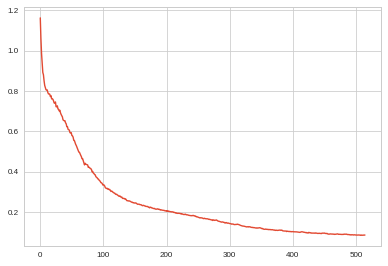

In [48]:
#@title ### Plot of Loss Values { form-width: "30%" }

compression = 10

loss = np.ndarray.flatten(loss_values)
loss = np.nanmean(np.pad(loss.astype(float), (0, compression - loss.size%compression), mode='constant', constant_values=np.NaN).reshape(-1, compression), axis=1)
plt.plot(loss)

In [50]:
#@title ### Validation { form-width: "30%" }

pred_list = []
true_values = []
valid_loss=0
c=0
for databatch in tqdm(parsed_valid_dataset):

    target = databatch[1]
    true_values.append(target.numpy())

    predictions = model(databatch[0],train_mode=False)
    pred_list.append(np.squeeze(predictions.numpy()))

    #loss_value = tf.keras.losses.MeanSquaredError()(target,predictions).numpy()
    loss_value = loss_fn(target, predictions).numpy()
    valid_loss+= loss_value
    c+=1

    print('validation loss', valid_loss/c)


0it [00:00, ?it/s]/usr/local/lib/python3.7/dist-packages/spektral/layers/convolutional/conv.py:94: UserWarning: The adjacency matrix of dtype <dtype: 'int64'> is incompatible with the dtype of the node features <dtype: 'float32'> and has been automatically cast to <dtype: 'float32'>.
  f"The adjacency matrix of dtype {a.dtype} is incompatible with the dtype "
1it [00:01,  1.71s/it]

validation loss 0.0843307301402092


2it [00:02,  1.04s/it]

validation loss 0.0836116224527359


3it [00:02,  1.20it/s]

validation loss 0.08344947546720505


4it [00:03,  1.39it/s]

validation loss 0.08371999487280846


5it [00:03,  1.50it/s]

validation loss 0.08400946259498596


6it [00:04,  1.57it/s]

validation loss 0.08432920277118683


7it [00:05,  1.63it/s]

validation loss 0.08464359279189791


8it [00:05,  1.68it/s]

validation loss 0.08436436764895916


9it [00:06,  1.72it/s]

validation loss 0.08442144923739964


10it [00:06,  1.71it/s]

validation loss 0.08432851284742356


11it [00:07,  1.72it/s]

validation loss 0.0842098742723465


12it [00:07,  1.75it/s]

validation loss 0.08406379322210948


13it [00:08,  1.75it/s]

validation loss 0.08418604674247596


14it [00:09,  1.73it/s]

validation loss 0.08413137229425567


15it [00:09,  1.72it/s]

validation loss 0.08413814355929693


16it [00:10,  1.72it/s]

validation loss 0.08427055785432458


17it [00:10,  1.71it/s]

validation loss 0.08428384977228501


18it [00:11,  1.73it/s]

validation loss 0.0844093043771055


19it [00:12,  1.74it/s]

validation loss 0.08449357865672362


20it [00:12,  1.75it/s]

validation loss 0.08454075716435909


21it [00:13,  1.74it/s]

validation loss 0.08459806548697608


22it [00:13,  1.75it/s]

validation loss 0.08458983999761668


23it [00:14,  1.74it/s]

validation loss 0.08461917094562364


24it [00:14,  1.70it/s]

validation loss 0.08449655491858721


25it [00:15,  1.71it/s]

validation loss 0.08453729510307312


26it [00:16,  1.71it/s]

validation loss 0.08460787368508485


27it [00:16,  1.72it/s]

validation loss 0.08458073851135042


28it [00:17,  1.71it/s]

validation loss 0.08456760777958802


29it [00:17,  1.72it/s]

validation loss 0.08442076295614243


30it [00:18,  1.73it/s]

validation loss 0.08437521085143089


31it [00:18,  1.74it/s]

validation loss 0.08434566663157556


32it [00:19,  1.77it/s]

validation loss 0.08432706445455551


33it [00:20,  1.76it/s]

validation loss 0.08436327043807867


34it [00:20,  1.77it/s]

validation loss 0.08439816293471


35it [00:21,  1.77it/s]

validation loss 0.08439305701426097


36it [00:21,  1.77it/s]

validation loss 0.08443210315373209


37it [00:22,  1.78it/s]

validation loss 0.0843741265503136


38it [00:22,  1.77it/s]

validation loss 0.08432221059736453


39it [00:23,  1.78it/s]

validation loss 0.08438478295619671


40it [00:24,  1.77it/s]

validation loss 0.08437785264104605


41it [00:24,  1.77it/s]

validation loss 0.0844006367572924


42it [00:25,  1.79it/s]

validation loss 0.0843958453763099


42it [00:40,  1.03it/s]


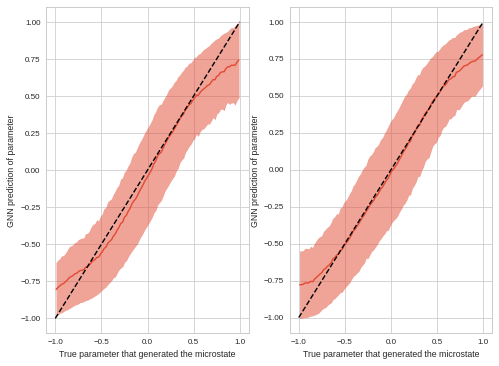

In [51]:
#@title ### Plots of Outputs

fig, axs = plt.subplots(1,2, figsize=(8, 6), facecolor='w', edgecolor='k')  

axs = axs.ravel()
for pred_i in range(2):
    pred_vals = np.array([pp[:,:,pred_i] for pp in pred_list]).flatten()
    true_vals = np.array([tt[:,:,pred_i] for tt in true_values]).flatten()

    bin_means, bin_edges, binnumber = stats.binned_statistic(true_vals, pred_vals,bins=100)
    bin_width = (bin_edges[1] - bin_edges[0])
    bin_centers = bin_edges[1:] - bin_width/2

    bin_stds, bin_edges, binnumber = stats.binned_statistic(true_vals, pred_vals,statistic='std',bins=100)


    axs[pred_i].plot(bin_centers,bin_means,c='C0')

    axs[pred_i].fill_between(bin_centers,bin_means-bin_stds,bin_means+bin_stds,color='C0',alpha=0.5)

    xx = np.linspace(true_vals.min(),true_vals.max(),10)
    axs[pred_i].plot(xx,xx,c='k',ls='--')

    axs[pred_i].set_ylabel('GNN prediction of parameter')
    axs[pred_i].set_xlabel('True parameter that generated the microstate')



#plt.savefig('gnn_' + str(run) + '.png',dpi=300)
#plt.show()

In [52]:
#@title ### Rollout Function { form-width: "30%" }

INPUT_SEQUENCE_LENGTH=WINDOW_SIZE-1

KINEMATIC_PARTICLE_ID = 3
def get_kinematic_mask(particle_types):
  """Returns a boolean mask, set to true for kinematic (obstacle) particles."""
  return tf.equal(particle_types, KINEMATIC_PARTICLE_ID)

def rollout(simulator, features, num_steps):
  """Rolls out a trajectory by applying the model in sequence."""
  
  initial_positions = features['pos'][tf.newaxis,0:INPUT_SEQUENCE_LENGTH]
  initial_velocities = features['vel'][tf.newaxis,0:INPUT_SEQUENCE_LENGTH]
  initial_accelerations = features['acc'][tf.newaxis,0:INPUT_SEQUENCE_LENGTH]
  ground_truth_positions = features['pos'][tf.newaxis,INPUT_SEQUENCE_LENGTH:]
  ground_truth_velocities = features['vel'][tf.newaxis,INPUT_SEQUENCE_LENGTH:]
  ground_truth_accelerations = features['acc'][tf.newaxis,INPUT_SEQUENCE_LENGTH:]
  global_context = None
  
  def step_fn(step, current_positions, current_velocities, current_accelerations, pos_predictions, vel_predictions, acc_predictions):
    if global_context is None:
      global_context_step = None
    else:
      global_context_step = global_context[
          step + INPUT_SEQUENCE_LENGTH - 1][tf.newaxis]

    next_velocity = simulator((current_positions,
                               current_velocities,
                               current_accelerations)
                    )
    next_position = next_velocity*dt+current_positions[:,-1]
    next_acceleration = (next_velocity - current_velocities[:,-1])/dt
    # Update kinematic particles from prescribed trajectory.
    kinematic_mask = get_kinematic_mask(tf.zeros(N))
    next_position_ground_truth = ground_truth_positions[:,step,:,:]
    next_velocity_ground_truth = ground_truth_velocities[:,step,:,:]
    next_acceleration_ground_truth = ground_truth_accelerations[:,step,:,:]
    next_position = tf.where(tf.expand_dims(kinematic_mask,-1), next_position_ground_truth,
                             next_position)
    next_velocity = tf.where(tf.expand_dims(kinematic_mask,-1), next_velocity_ground_truth,
                             next_velocity)
    next_acceleration = tf.where(tf.expand_dims(kinematic_mask,-1), next_acceleration_ground_truth,
                             next_acceleration)
    updated_pos_predictions = pos_predictions.write(step, next_position)
    updated_vel_predictions = vel_predictions.write(step, next_velocity)
    updated_acc_predictions = acc_predictions.write(step, next_acceleration)
    # Shift `current_positions`, removing the oldest position in the sequence
    # and appending the next position at the end.
    next_positions = tf.concat([current_positions[:,1:,:,:],
                                next_position[:,tf.newaxis,:,:]], axis=1)
    next_velocities = tf.concat([current_velocities[:,1:,:,:],
                                next_velocity[:,tf.newaxis,:,:]], axis=1)
    next_accelerations = tf.concat([current_accelerations[:,1:,:,:],
                                next_acceleration[:,tf.newaxis,:,:]], axis=1)
  
    return (step + 1, next_positions, next_velocities, next_accelerations, updated_pos_predictions, updated_vel_predictions, updated_acc_predictions)
  
  pos_predictions = tf.TensorArray(size=num_steps, dtype=tf.float32)
  vel_predictions = tf.TensorArray(size=num_steps, dtype=tf.float32)
  acc_predictions = tf.TensorArray(size=num_steps, dtype=tf.float32)

  _, _, _, _, pos_predictions, vel_predictions, acc_predictions = tf.while_loop(
      cond=lambda step, state, vel, acc, pos_prediction, vel_prediction, acc_prediction: tf.less(step, num_steps),
      body=step_fn,
      loop_vars=(0, initial_positions, initial_velocities, initial_accelerations, pos_predictions, vel_predictions, acc_predictions),
      parallel_iterations=1)
  
  #pos_predictions = tf.transpose(pos_predictions, perm=[1,0,2,3])

  output_dict = {
      'initial_positions': initial_positions,
      'initial_velocities': initial_velocities,
      'initial_accelerations': initial_accelerations,
      'pos_predicted_rollout': pos_predictions.stack(),
      'vel_predicted_rollout': vel_predictions.stack(),
      'acc_predicted_rollout': acc_predictions.stack(),
      'ground_truth_position_rollout': ground_truth_positions,
      'ground_truth_velocity_rollout': ground_truth_velocities,
      'ground_truth_acceleration_rollout': ground_truth_accelerations
  }

  
  for field in ['pos_predicted_rollout','vel_predicted_rollout','acc_predicted_rollout']:
    output_dict[field]=tf.transpose(output_dict[field], perm=[1,0,2,3])


  if global_context is not None:
    output_dict['global_context'] = global_context
  return output_dict

In [53]:
#@title ### Create Rollout Data { form-width: "30%" }

valid_dataset =  tf.data.TFRecordDataset(tf.data.Dataset.list_files([valid_dir + filename for filename in os.listdir(valid_dir)]))

parsed_rollout_dataset = valid_dataset.map(_parse_record)
parsed_rollout_dataset = parsed_rollout_dataset.map(_parse_tensor)

for databatch in parsed_rollout_dataset:
    num_steps = databatch['pos'].shape[0]-INPUT_SEQUENCE_LENGTH
    output = rollout(model,databatch,num_steps)
    break

#output['metadata'] = metadata
filename = '/zonal_model.pkl'
with open(filename, 'wb') as file:
    pickle.dump(output, file)

/usr/local/lib/python3.7/dist-packages/spektral/layers/convolutional/conv.py:94: UserWarning: The adjacency matrix of dtype <dtype: 'int64'> is incompatible with the dtype of the node features <dtype: 'float32'> and has been automatically cast to <dtype: 'float32'>.
  f"The adjacency matrix of dtype {a.dtype} is incompatible with the dtype "


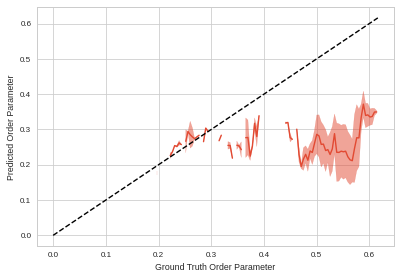

In [56]:
#@title ### Order Parameter Plot

pred_av_velocity = np.mean(output['vel_predicted_rollout'][0,...],axis=1)
true_av_velocity = np.mean(output['ground_truth_velocity_rollout'][0,...],axis=1)
pred_std = np.std(output['vel_predicted_rollout'][0,...],axis=1)
true_std = np.std(output['ground_truth_velocity_rollout'][0,...],axis=1)

pred_order_parameter = np.linalg.norm(pred_av_velocity,axis=1)/vs
true_order_parameter = np.linalg.norm(true_av_velocity,axis=1)/vs

line = np.linspace(0,max(pred_order_parameter),10)
#plt.scatter(true_order_parameter, pred_order_parameter)
#plt.plot(line, line)

order = np.argsort(true_order_parameter)
true_order_parameter = true_order_parameter[order]
pred_order_parameter = pred_order_parameter[order]

bin_means, bin_edges, binnumber = stats.binned_statistic(true_order_parameter, pred_order_parameter,bins=100)
bin_width = (bin_edges[1] - bin_edges[0])
bin_centers = bin_edges[1:] - bin_width/2

bin_stds, bin_edges, binnumber = stats.binned_statistic(true_order_parameter, pred_order_parameter,statistic='std',bins=100)
max_val=max([np.amax(pred_order_parameter), np.amax(true_order_parameter)])
xx = np.linspace(0,max_val,10)
plt.plot(bin_centers,bin_means,c='C0')
plt.plot(xx,xx,c='k',ls='--')
plt.xlabel("Ground Truth Order Parameter")
plt.ylabel("Predicted Order Parameter")
plt.fill_between(bin_centers,bin_means-bin_stds,bin_means+bin_stds,color='C0',alpha=0.5)


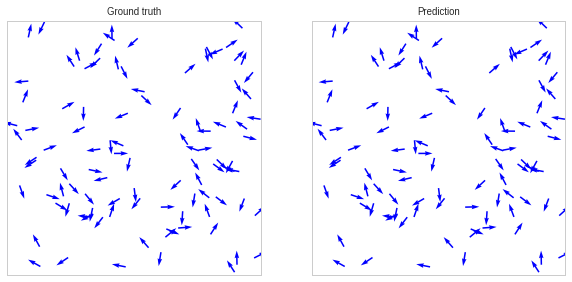

In [55]:
#@title ### Render Rollouts

TYPE_TO_COLOR = {
    3: "black",  # Boundary particles.
    0: "green",  # Rigid solids.
    7: "magenta",  # Goop.
    6: "gold",  # Sand.
    5: "blue",  # Water.
}

step_stride = 3
block_on_show = True

with open(filename, "rb") as file:
  rollout_data = pickle.load(file)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

plot_info = []
Q={}
for ax_i, (label, (rollout_field_1, rollout_field_2)) in enumerate(
    [("Ground truth", ("ground_truth_position_rollout", "ground_truth_velocity_rollout")),
      ("Prediction", ("pos_predicted_rollout", "vel_predicted_rollout"))]):
  # Append the initial positions to get the full trajectory.
  pos_trajectory = np.concatenate([
      rollout_data["initial_positions"][0,...],
      rollout_data[rollout_field_1][0,...]], axis=0)
  vel_trajectory = np.concatenate([
      rollout_data["initial_velocities"][0,...],
      rollout_data[rollout_field_2][0,...]], axis=0)
  ax = axes[ax_i]
  ax.set_title(label)
  bounds = [(0,DOMAIN_SIZE), (0,DOMAIN_SIZE)]
  ax.set_xlim(bounds[0][0], bounds[0][1])
  ax.set_ylim(bounds[1][0], bounds[1][1])
  ax.set_xticks([])
  ax.set_yticks([])
  ax.set_aspect(1.)
  points = {
      particle_type: ax.plot([], [], "o", ms=2, color=color)[0]
      for particle_type, color in TYPE_TO_COLOR.items()}
  X, Y, U, V = pos_trajectory[0,:,0], pos_trajectory[0,:,1], vel_trajectory[0,:,0], vel_trajectory[0,:,1]
  Q[f'{ax_i}'] = ax.quiver(X, Y, U, V, pivot='mid', color='b', units='inches')
  plot_info.append((ax, pos_trajectory, vel_trajectory, points))


num_steps = pos_trajectory.shape[0]
#print(pos_trajectory.shape)

def update_quiver(num):
  for i, (ax, pos_trajectory, vel_trajectory, _) in enumerate(plot_info):
    U, V = vel_trajectory[num,:,0], vel_trajectory[num,:,1]
    offsets = pos_trajectory[num]

    Q[f'{i}'].set_offsets(offsets)
    Q[f'{i}'].set_UVC(U,V)
  return axes

anim = animation.FuncAnimation(fig, update_quiver,
                               interval=50, frames=np.arange(0, num_steps, step_stride),blit=False)
#plt.show(block=block_on_show)
rc('animation', html='jshtml')
anim


In [ ]:
_, allpos, allvel, _ = plot_info[1]
#allvel = simulation_cls.micro_state[0,:,:,2:]
        
X, Y = allpos[0,:,0],allpos[0,:,1]
U, V = allvel[0,:,0],allvel[0,:,1]
skip=50
fig, ax = plt.subplots(1,1,figsize=(8,8))
plt.close()
Q = ax.quiver(X, Y, U, V, pivot='mid', color='b', units='inches')
ax.axis('equal')
ax.set_xlim(0,DOMAIN_SIZE)
ax.set_ylim(0,DOMAIN_SIZE)

def update_quiver(num, Q, X, Y):
    """updates the horizontal and vertical vector components by a
    fixed increment on each frame
    """
    U, V = allvel[num,:,0],allvel[num,:,1]
    offsets = allpos[num]

    Q.set_offsets(offsets)
    Q.set_UVC(U,V)

    return Q,

# you need to set blit=False, or the first set of arrows never gets
# cleared on subsequent frames
anim = animation.FuncAnimation(fig, update_quiver, fargs=(Q, X, Y),
                               interval=50, frames=num_steps,blit=False)

rc('animation', html='jshtml')
anim
